In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import TensorBoard
import os
from sklearn.metrics import classification_report
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.applications import ResNet50
# Common
import os 
import keras
import numpy as np 
import tensorflow as tf

# Data 
#from keras.preprocessing.image import ImageDataGenerator

# Data Visualization
import plotly.express as px
import matplotlib.pyplot as plt

# Model 
from keras.models import Sequential, load_model
from keras.layers import GlobalAvgPool2D as GAP, Dense, Dropout

# Callbacks 
from keras.callbacks import EarlyStopping, ModelCheckpoint

# Pre-Trained Model
from tensorflow.keras.applications import ResNet50, ResNet50V2, InceptionV3, Xception, ResNet152, ResNet152V2

In [2]:
import shutil

# Define paths
input_dir = "/kaggle/input/vegetable-image-dataset"
output_dir = "/kaggle/working/vegetable-image-dataset"

# Copy dataset to working directory
shutil.copytree(input_dir, output_dir)

print(f"Dataset copied to {output_dir}")



Dataset copied to /kaggle/working/vegetable-image-dataset


In [3]:


import cv2
import os
import numpy as np
from PIL import Image

def is_blurry(image_path, threshold=100):
    """
    Check if an image is blurry using Laplacian variance.
    :param image_path: Path to the image file.
    :param threshold: Variance threshold (lower values indicate blurrier images).
    :return: True if the image is blurry, False otherwise.
    """
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Read image in grayscale
    if image is None:
        print(f"Warning: Unable to read image {image_path}. Skipping.")
        return True  # Consider unreadable images as blurry to remove them

    laplacian_var = cv2.Laplacian(image, cv2.CV_64F).var()  # Compute Laplacian variance
    return laplacian_var < threshold

def remove_blurry_images(dataset_dir, threshold=100):
    """
    Remove blurry images from a dataset directory.
    :param dataset_dir: Path to the dataset directory.
    :param threshold: Laplacian variance threshold.
    """
    nb=0
    for root, _, files in os.walk(dataset_dir):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                image_path = os.path.join(root, file)
                if is_blurry(image_path, threshold):
                    nb=nb+1
                    #print(f"Removing blurry image: {image_path}")
                    os.remove(image_path)
    print(nb)

# Example usage
dataset_dir = "/kaggle/working/vegetable-image-dataset"
remove_blurry_images(dataset_dir, threshold=100)  # Adjust threshold as needed



1337


In [4]:
def filter_by_resolution(dataset_dir, min_width=224, min_height=224):
    """
    Filter images by resolution and remove those that don't meet the minimum requirements.
    :param dataset_dir: Path to the dataset directory.
    :param min_width: Minimum allowed width.
    :param min_height: Minimum allowed height.
    """
    for root, _, files in os.walk(dataset_dir):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                image_path = os.path.join(root, file)
                try:
                    with Image.open(image_path) as img:
                        width, height = img.size
                        if width < min_width or height < min_height:
                            print(f"Removing image with incorrect resolution: {image_path} ({width}x{height})")
                            os.remove(image_path)
                except Exception as e:
                    print(f"Error processing {image_path}: {e}")

# Example usage
filter_by_resolution(dataset_dir, min_width=224, min_height=224)  # Adjust resolution as needed

Removing image with incorrect resolution: /kaggle/working/vegetable-image-dataset/Vegetable Images/train/Bitter_Gourd/0609.jpg (224x200)
Removing image with incorrect resolution: /kaggle/working/vegetable-image-dataset/Vegetable Images/train/Bitter_Gourd/0430.jpg (224x193)
Removing image with incorrect resolution: /kaggle/working/vegetable-image-dataset/Vegetable Images/train/Bitter_Gourd/0526.jpg (224x205)
Removing image with incorrect resolution: /kaggle/working/vegetable-image-dataset/Vegetable Images/train/Papaya/0176.jpg (224x198)
Removing image with incorrect resolution: /kaggle/working/vegetable-image-dataset/Vegetable Images/train/Papaya/0126.jpg (224x211)
Removing image with incorrect resolution: /kaggle/working/vegetable-image-dataset/Vegetable Images/test/Papaya/1246.jpg (224x207)
Removing image with incorrect resolution: /kaggle/working/vegetable-image-dataset/Vegetable Images/validation/Papaya/1138.jpg (224x187)
Removing image with incorrect resolution: /kaggle/working/veg

In [5]:
dataset_path ="/kaggle/working/vegetable-image-dataset/Vegetable Images"
# Class Names
root_path = '/kaggle/working/vegetable-image-dataset/Vegetable Images/train/'
class_names = sorted(os.listdir(root_path))
n_classes = len(class_names)

# Class Distribution
class_dis = [len(os.listdir(root_path + name)) for name in class_names]


# Show
print(f"Total Number of Classes : {n_classes} \nClass Names : {class_names}")

Total Number of Classes : 15 
Class Names : ['Bean', 'Bitter_Gourd', 'Bottle_Gourd', 'Brinjal', 'Broccoli', 'Cabbage', 'Capsicum', 'Carrot', 'Cauliflower', 'Cucumber', 'Papaya', 'Potato', 'Pumpkin', 'Radish', 'Tomato']


In [6]:
# Visualize 
fig = px.pie(names=class_names, values=class_dis, title="Class Distribution", hole=0.4)
fig.update_layout({'title':{'x':0.5}})
fig.show()

In [7]:

# Training Data Generator (with Augmentation)
train_datagen = ImageDataGenerator(
    rescale=1./255,     # Normalize pixel values
    rotation_range=30,   # Data augmentation: Rotate images
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Validation Data Generator (No Augmentation, Just Rescaling)
valid_datagen = ImageDataGenerator(rescale=1./255)

# Test Data Generator (No Augmentation, Just Rescaling)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load Training Data
train_ds = train_datagen.flow_from_directory(
    dataset_path + "/train", 
    target_size=(224, 224), 
    batch_size=64, 
    class_mode="categorical"
)

# Load Validation Data (From Separate Folder)
valid_ds = valid_datagen.flow_from_directory(
    dataset_path + "/validation",
    target_size=(224, 224),
    batch_size=64,
    class_mode="categorical"
)

# Load Test Data
test_ds = test_datagen.flow_from_directory(
    dataset_path + "/test",
    target_size=(224, 224),
    batch_size=64,
    class_mode="categorical"
)

Found 14005 images belonging to 15 classes.
Found 2836 images belonging to 15 classes.
Found 2814 images belonging to 15 classes.


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D as GAP, Dense
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import numpy as np

# Pre-Trained Model
base_model = ResNet50V2(input_shape=(224,224,3), include_top=False)
base_model.trainable = False

# Model Architecture
name = "ResNet50V2"
n_classes = 15  # Update this to match the number of classes in your dataset
model = Sequential([
    base_model,
    GAP(),
    Dense(256, activation='relu', kernel_initializer='he_normal'),
    Dense(n_classes, activation='softmax')
], name=name)

# Callbacks
cbs = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint(name + ".keras", save_best_only=True)
]

# Compile the model
model.compile(optimizer="adam",
              loss="categorical_crossentropy",  # Ensure loss matches categorical labels
              metrics=["accuracy"])

# Train the model
history = model.fit(train_ds, 
                    validation_data=valid_ds, 
                    epochs=10, 
                    callbacks=cbs)

# Plot Training and Validation Loss and Accuracy
def plot_training_history(history):
    """
    Plot training and validation loss and accuracy.
    """
    plt.figure(figsize=(12, 5))

    # Plot Loss
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    # Plot Accuracy
    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Generate Classification Report and Confusion Matrix
def evaluate_model(model, test_generator):
    """
    Evaluate the model using a test generator.
    """
    # Get true labels and predictions
    y_true = test_generator.classes
    y_pred = np.argmax(model.predict(test_generator), axis=1)

    # Get class labels
    class_labels = list(test_generator.class_indices.keys())

    # Classification Report
    print("Classification Report:")
    print(classification_report(y_true, y_pred, target_names=class_labels))

    # Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

# Plot Training History
plot_training_history(history)

# Evaluate the Model on Test Data
evaluate_model(model, test_ds)

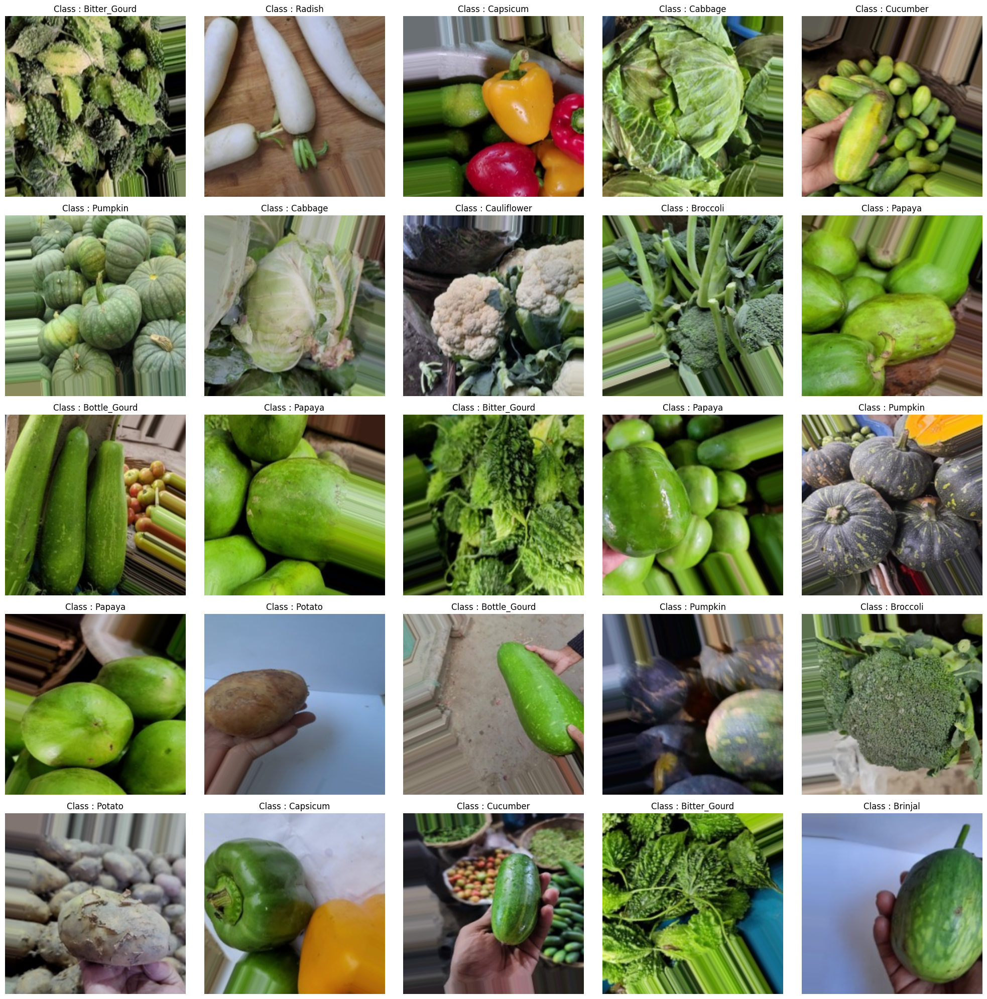

In [9]:
# Define class_names
class_names = list(train_ds.class_indices.keys())

# Function to display images
def show_images(GRID=[5,5], model=None, size=(20,20), data=train_ds):
    n_rows = GRID[0]
    n_cols = GRID[1]
    n_images = n_cols * n_rows
    
    i = 1
    plt.figure(figsize=size)
    for images, labels in data:
        id = np.random.randint(len(images))  # Random index within the batch
        image = images[id]
        label = class_names[np.argmax(labels[id])]  # Convert one-hot to class name
        
        plt.subplot(n_rows, n_cols, i)
        plt.imshow(image)
        
        if model is None:
            title = f"Class : {label}"
        else:
            pred = class_names[int(np.argmax(model.predict(image[np.newaxis, ...])))]
            title = f"Org : {label}, Pred : {pred}"
        
        plt.title(title)
        plt.axis('off')
        
        i += 1
        if i >= (n_images + 1):
            break
            
    plt.tight_layout()
    plt.show()

# Call the function
show_images()

In [10]:

# Train the model (replace with your dataset)
#model.fit(train_ds, validation_data=valid_ds, epochs=3)

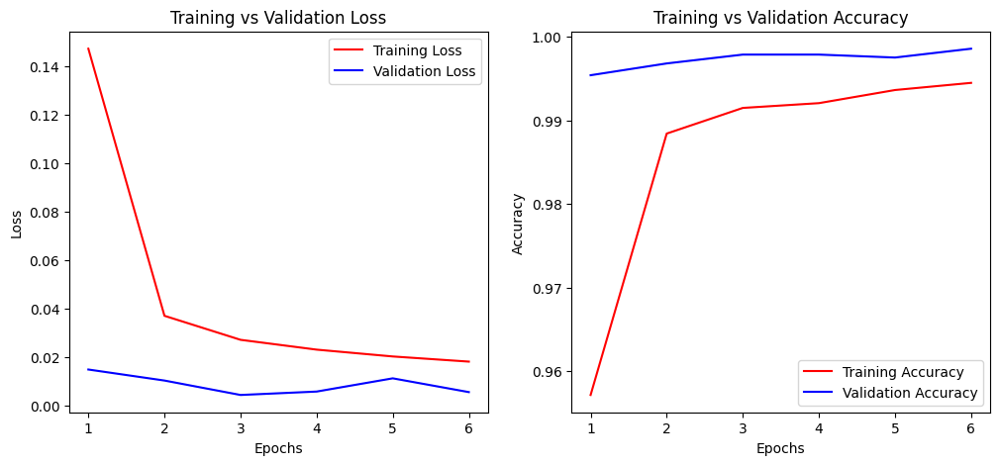

In [11]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy/loss
def plot_learning_curve(history):
    epochs = range(1, len(history.history['loss']) + 1)

    # Loss Graph
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.plot(epochs, history.history['loss'], 'r', label='Training Loss')
    plt.plot(epochs, history.history['val_loss'], 'b', label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training vs Validation Loss')
    plt.legend()

    # Accuracy Graph
    plt.subplot(1, 2, 2)
    plt.plot(epochs, history.history['accuracy'], 'r', label='Training Accuracy')
    plt.plot(epochs, history.history['val_accuracy'], 'b', label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Training vs Validation Accuracy')
    plt.legend()

    plt.show()

if history is not None:
    plot_learning_curve(history)
else:
    print("Error: Training did not return a valid history object.")

Evaluation 

In [12]:
model.save('Image_classify.h5')

# Architecture
model.summary()

Model: "ResNet50V2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ resnet50v2 (Functional)              │ (None, 7, 7, 2048)          │      23,564,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │         524,544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 15)                  │           3,855 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 25,149,999 (95.94 MB)

 Trainable params: 528,399 (2.02 MB)

 Non-trainable params: 23,564,800 (89.89 MB)

 Optimizer params: 1,056,800 (4.03 MB)

In [13]:
# Evaluation on test Set
model.evaluate(test_ds)

44/44 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - accuracy: 0.9941 - loss: 0.0285


[0.01874047890305519, 0.994669497013092]

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


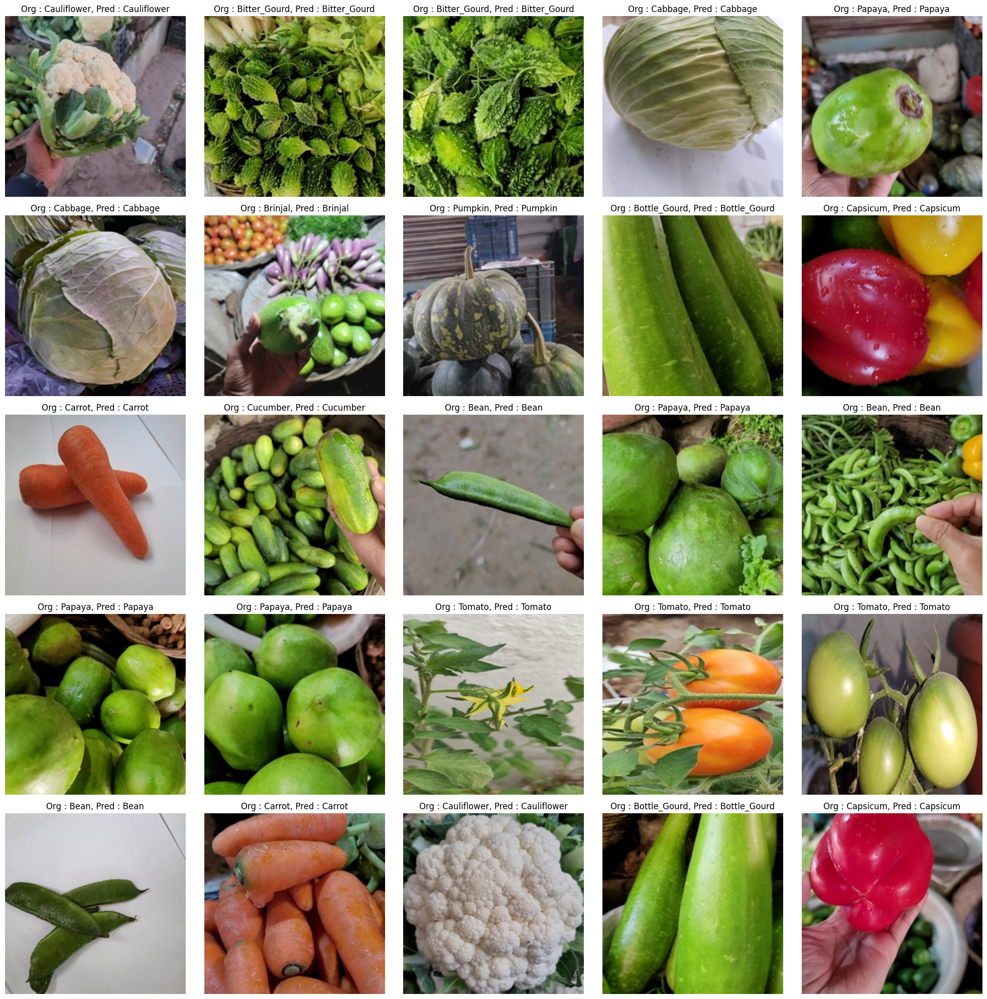

In [14]:
# Visualize Predictions
show_images(model=model, data=test_ds)

In [15]:
import numpy as np
from sklearn.metrics import classification_report

def generate_classification_report(model, test_generator):
    """
    Generate a classification report for a model using a test generator.

    Args:
        model: Trained Keras model.
        test_generator: ImageDataGenerator or similar for test data.

    Returns:
        None (prints the classification report).
    """
    # Get true labels and predictions
    y_true = test_generator.classes
    y_pred = np.argmax(model.predict(test_generator), axis=1)

    # Get class labels
    class_labels = list(test_generator.class_indices.keys())

    # Generate classification report
    report = classification_report(y_true, y_pred, target_names=class_labels)
    print(report)

# Example usage
generate_classification_report(model, test_ds)

44/44 ━━━━━━━━━━━━━━━━━━━━ 5s 122ms/step
              precision    recall  f1-score   support

        Bean       0.09      0.10      0.10       197
Bitter_Gourd       0.05      0.05      0.05       199
Bottle_Gourd       0.08      0.08      0.08       199
     Brinjal       0.05      0.05      0.05       197
    Broccoli       0.05      0.04      0.05       200
     Cabbage       0.09      0.09      0.09       200
    Capsicum       0.05      0.05      0.05       157
      Carrot       0.05      0.05      0.05       174
 Cauliflower       0.07      0.07      0.07       200
    Cucumber       0.07      0.07      0.07       192
      Papaya       0.04      0.04      0.04       189
      Potato       0.04      0.04      0.04       130
     Pumpkin       0.08      0.08      0.08       200
      Radish       0.04      0.04      0.04       195
      Tomato       0.04      0.04      0.04       185

    accuracy                           0.06      2814
   macro avg       0.06      0.06      

In [16]:
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image

# Load and preprocess the image
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))  # Resize to model input size
    img_array = image.img_to_array(img)  # Convert to array
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = img_array / 255.0  # Normalize (same as training)
    return img_array

# Predict the class of an image
def predict_image(model, img_path):
    class_labels = list(test_ds.class_indices.keys())
    img_array = preprocess_image(img_path)
    prediction = model.predict(img_array)  # Get model prediction
    predicted_class = np.argmax(prediction)  # Get index of highest probability
    predicted_label = class_labels[predicted_class]  # Get class name
    
    print(f"Predicted Class: {predicted_label}")
    return predicted_label


In [17]:
test_img_path = "/kaggle/input/testing/potato.jpeg"  # Replace with the actual image path
predicted_class = predict_image(model,test_img_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Predicted Class: Potato


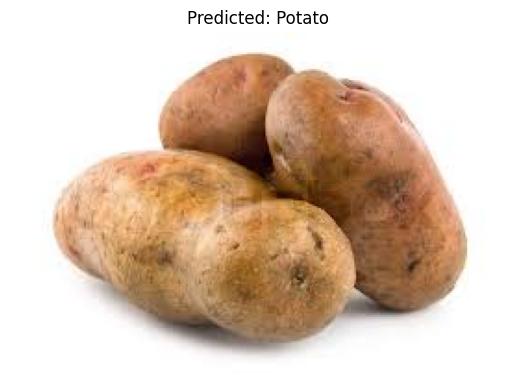

In [18]:
import matplotlib.pyplot as plt

def display_image(img_path, predicted_class):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR (OpenCV) to RGB
    plt.imshow(img)
    plt.title(f"Predicted: {predicted_class}")
    plt.axis("off")
    plt.show()

# Show the image with predicted class
display_image(test_img_path, predicted_class)

In [19]:
!pip install streamlit
!npm install localtunnel

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.6/9.6 MB 78.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 106.9 MB/s eta 0:00:0000:01
⠙⠹⠸⠼⠴⠦⠧⠇⠏⠋⠙⠹⠸
added 22 packages in 2s
⠸
⠸3 packages are looking for funding
⠸  run `npm fund` for details
⠸npm notice
npm notice New major version of npm available! 10.8.2 -> 11.1.0
npm notice Changelog: https://github.com/npm/cli/releases/tag/v11.1.0
npm notice To update run: npm install -g npm@11.1.0
npm notice
⠸

In [20]:
%%writefile app.py
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import load_model
import streamlit as st
import numpy as np
from PIL import Image

model = load_model('/kaggle/working/Image_classify.h5')

data_cat = [
    ['Bean'], ['Bitter_Gourd'], ['Bottle_Gourd'], ['Brinjal'], ['Broccoli'], ['Cabbage'], ['Capsicum'], ['Carrot'], ['Cauliflower'], 
    ['Cucumber'], ['Papaya'], ['Potato'], ['Pumpkin'], ['Radish'], ['Tomato']
]

img_height = 224
img_width = 224

st.set_page_config(page_title="Fruit & Vegetable Classifier", layout="centered")
st.sidebar.title("About the Model")
st.sidebar.markdown(
    """
    - **Type**: Image Classification
    - **Model**: Convolutional Neural Network (CNN)
    - **Framework**: TensorFlow/Keras
    - **Classes**: 15 Categories
    """
)

st.title("🌟 Fruit & Vegetable Classifier 🌟")
st.write("Upload an image of a fruit or vegetable, and this app will classify it for you!")

uploaded_file = st.file_uploader("Choose an image", type=["jpg", "jpeg", "png"])

if uploaded_file:
    try:
        # Open the uploaded image using PIL
        image = Image.open(uploaded_file)
        # Resize the image to 224x224
        image = image.resize((img_width, img_height))
        # Convert the image to a numpy array
        img_arr = np.array(image)
        # Normalize the image
        img_arr = img_arr / 255.0
        # Add batch dimension
        img_bat = np.expand_dims(img_arr, axis=0)

        predict = model.predict(img_bat)
        score = tf.nn.softmax(predict)

        st.image(image, width=250, caption="Uploaded Image")
        
        st.markdown(f"### Predicted Category: **{data_cat[np.argmax(score)][0]}**")
        st.progress(int(np.max(score) * 100)) 
        st.markdown(f"### 🎯 Accuracy: **{np.max(score) * 100:0.2f}%**")
    
    except Exception as e:
        st.error("An error occurred while processing the image. Please try a different file.")
else:
    st.info("👆 Upload an image file to get started!")


Writing app.py


In [ ]:
# Your public ip is the password to the localtunnel
!curl ipv4.icanhazip.com

In [ ]:
!streamlit run app.py &>./logs.txt & npx localtunnel --port 8501